In [3]:
import h5py as h


We trust you have received the usual lecture from the local System
Administrator. It usually boils down to these three things:

    #1) Respect the privacy of others.
    #2) Think before you type.
    #3) With great power comes great responsibility.

[sudo] password for bsherwin6: 
sudo: timed out reading password
Defaulting to user installation because normal site-packages is not writeable
  Using cached mpi4py-3.1.4.tar.gz (2.5 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for mpi4py (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [156 lines of output]
      running bdist_wheel
      running build
      running build_src
      running build_py
      creating build
      creating build/lib.linux-x86_64-cpython-39
      creating build/lib.linux-x86_64-cpython-39/mpi4py
      copying src/mpi4py/__init__.py -> build/l

In [4]:
ds = h.File('catalog.h5')
print(ds)

<HDF5 file "catalog.h5" (mode r)>


In [4]:
import numpy as np
import matplotlib.pyplot as plt

In [5]:
all_groups = {}
fescs = []
groups = []
fgases = []
masses = []
SFRs = [] 
Mstars = []
redshifts = []
for halo in ds.keys(): # loops through halos
    fesc_list = list(ds[halo]['fesc'])
    fgas_list = list(ds[halo]['fgas'])
    mass_list = list(ds[halo]['mass'])
    SFR_list = list(ds[halo]['SFR'])
    Mstar_list = list(ds[halo]['Mstar'])
    redshift_list = list(ds[halo]['redshift'])    
    for index, fesc in enumerate(fesc_list):# loops thru timestep
        if fesc <= 0.01:
            group = 0
        elif 0.01 < fesc <= 0.10:
            group = 1
        elif 0.10 < fesc <= 0.25:
            group = 2
        else:
            group = 3
        # used enumerate to find index and only use "good" values
        if fesc >= 1e-5:
            fescs.append(fesc)
            groups.append(group)
            fgases.append(ds[halo]['fgas'][index])
            masses.append(ds[halo]['mass'][index])
            SFRs.append(ds[halo]['SFR'][index])
            Mstars.append(ds[halo]['Mstar'][index])
            redshifts.append(ds[halo]['redshift'][index])
    all_groups[halo] = groups

# Sanity check: All parameter arrays should be same size
print(len(fescs), len(fgases), len(masses), len(SFRs), len(Mstars), len(redshifts)) # length is 3122 for all

# Sanity check 2: Length of all_groups should be same as number of halos
print(len(ds.keys()) == len(all_groups)) # length is 168




2139 2139 2139 2139 2139 2139
True


In [7]:
file = open('redshifts.dat')
file_names = []
file_redshifts = []
for line in file:
    data = line.split()
    file_names.append(data[0])
    file_redshifts.append(float(data[2]))
file_names = np.array(file_names)
file_redshifts = np.array(file_redshifts)

all_filename = {}
for halo in list(ds.keys()):
    all_filename[halo] = []
    for z in ds[halo]['redshift']:
        idx = np.argmin(abs(file_redshifts - z))
        all_filename[halo].append(file_names[idx][2:6])
print(all_filename)        
''' 
pace_redshifts_RP = np.loadtxt('redshifts.dat', dtype = str, delimiter = ' ')
pace_redshifts = {}
eps = 1e-2

for i in range(len(pace_redshifts_RP)):
    pace_redshifts[pace_redshifts_RP[i][0][40:46]] = float(pace_redshifts_RP[i][4])

for value in pace_redshifts.values():
    for redshift in np.unique(redshifts):
        if np.abs(value - redshift) < eps:
            print(f'Match: {list(pace_redshifts.keys())[list(pace_redshifts.values()).index(value)]}, my value {redshift}, pace value {value}')
'''

{'Halo00000000': ['0041', '0040', '0039', '0038', '0037', '0036', '0035', '0034', '0033', '0032', '0031', '0030', '0029', '0028', '0027', '0026', '0025', '0024', '0023', '0022', '0021', '0020', '0019', '0018', '0017', '0016', '0015', '0014', '0013', '0012', '0011', '0010', '0009', '0008', '0007', '0006'], 'Halo00000001': ['0041', '0040', '0039', '0038', '0037', '0036', '0035', '0034', '0033', '0032', '0031', '0030', '0029', '0028', '0027', '0026', '0025', '0024', '0023', '0022', '0021', '0020', '0019', '0018', '0017', '0016', '0015', '0014', '0013'], 'Halo00000002': ['0041', '0040', '0039', '0038', '0037', '0036', '0035', '0034', '0033', '0032', '0031', '0030', '0029', '0028', '0027', '0026', '0025', '0024', '0023', '0022', '0021', '0020', '0019', '0018', '0017', '0016', '0015', '0014', '0013', '0012', '0011', '0010', '0009', '0008', '0007', '0006', '0005', '0004', '0003', '0002'], 'Halo00000003': ['0041', '0040', '0039', '0038', '0037', '0036', '0035', '0034', '0033', '0032', '0031', 

" \npace_redshifts_RP = np.loadtxt('redshifts.dat', dtype = str, delimiter = ' ')\npace_redshifts = {}\neps = 1e-2\n\nfor i in range(len(pace_redshifts_RP)):\n    pace_redshifts[pace_redshifts_RP[i][0][40:46]] = float(pace_redshifts_RP[i][4])\n\nfor value in pace_redshifts.values():\n    for redshift in np.unique(redshifts):\n        if np.abs(value - redshift) < eps:\n            print(f'Match: {list(pace_redshifts.keys())[list(pace_redshifts.values()).index(value)]}, my value {redshift}, pace value {value}')\n"

In [9]:
import h5py
directory = '/storage/home/hcoda1/0/jw254/data/RS-RP/May_2018-fesc/RP/fesc-data'
data = h5py.File(directory + '/pRedshiftOutput0041_fesc_halos.h5')
data.keys()

<KeysViewHDF5 ['Halo00000000', 'Halo00000001', 'Halo00000002', 'Halo00000003', 'Halo00000004', 'Halo00000005', 'Halo00000006', 'Halo00000007', 'Halo00000008', 'Halo00000009', 'Halo00000010', 'Halo00000011', 'Halo00000012', 'Halo00000013', 'Halo00000014', 'Halo00000015', 'Halo00000016', 'Halo00000017', 'Halo00000018', 'Halo00000019', 'Halo00000020', 'Halo00000021', 'Halo00000022', 'Halo00000023', 'Halo00000024', 'Halo00000025', 'Halo00000026', 'Halo00000027', 'Halo00000028', 'Halo00000029', 'Halo00000030', 'Halo00000031', 'Halo00000032', 'Halo00000033', 'Halo00000034', 'Halo00000035', 'Halo00000036', 'Halo00000037', 'Halo00000038', 'Halo00000039', 'Halo00000040', 'Halo00000041', 'Halo00000042', 'Halo00000043', 'Halo00000044', 'Halo00000045', 'Halo00000046', 'Halo00000047', 'Halo00000048', 'Halo00000049', 'Halo00000050', 'Halo00000051', 'Halo00000052', 'Halo00000053', 'Halo00000054', 'Halo00000055', 'Halo00000056', 'Halo00000057', 'Halo00000058', 'Halo00000059', 'Halo00000060', 'Halo0000

In [ ]:
# do same as redshifts for centers w/ data and ds
# list of centers for data halos compare to ds centers, sum three components, subtract one center from all others

for halo_fesc in data.keys():
    # dr = separation, R = radius of target halo, r = radii of all catalog halos
    dr = np.sqrt(((data['Halo00000001']['center'][()] - ds['Halo00000000']['center'][0])**2).sum(1))
    R = ds['Halo00000000']['rvir'][0]
    r =  data['Halo00000001']['rvir'][()] * (1 + redshifts[ip]) / trees.box_size.in_units('kpc').v

    # Calculate the sphere-sphere intersection. The maximum is the match.
    # http://mathworld.wolfram.com/Sphere-SphereIntersection.html
    vol = np.pi * (R+r-dr)**2 * (dr**2 + 2*dr*r - 3*r**2 + 2*dr*R + 6*r*R - 3*R**2) / (12*dr)
    vol[dr > r+R] = 0.0  # No intersection
    vol[dr < R-r] = (4*np.pi/3) * r[dr < R-r]**3  # Complete intersection

    match = vol.argmax()
    rvir = data['Halo00000001']['rvir'][()][match] * (1 + redshifts[ip]) / trees.box_size.in_units('kpc').v
    # Check whether separation is within the virial radius
    if dr[match] >= rvir:
        continue
    # Add halo properties to mmp history
    for f in fields:
        halo[f][inode] = catalog[ip][f][match]
# Calculate SFR (last 20 Myr) [Msun/yr]
halo['SFR'] = halo['Mstar_pop2_young'] / 20e6
halo['fesc'] = np.maximum(halo['fesc'], 1e-6)

In [36]:
import yt
ytds = yt.load('/storage/home/hcoda1/0/jw254/data/RS-RP/RD0041/RedshiftOutput0041')
ytds.domain_width.to("kpc")[0].v # do for all ds, id and domain width dictionary, replace trees.box_size with value in dict, same for redshift (parallel arrays)

yt : [INFO     ] 2023-06-30 14:35:13,027 Parameters: current_time              = 12.75658720606
yt : [INFO     ] 2023-06-30 14:35:13,028 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-06-30 14:35:13,028 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-06-30 14:35:13,029 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-06-30 14:35:13,029 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-06-30 14:35:13,030 Parameters: current_redshift          = 14.999999224523
yt : [INFO     ] 2023-06-30 14:35:13,030 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-06-30 14:35:13,030 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-06-30 14:35:13,031 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-06-30 14:35:13,031 Parameters: hubble_constant           = 0.71


array(2500.00012117)

In [10]:
print(ds.keys())

<KeysViewHDF5 ['Halo00000000', 'Halo00000001', 'Halo00000002', 'Halo00000003', 'Halo00000004', 'Halo00000005', 'Halo00000006', 'Halo00000007', 'Halo00000008', 'Halo00000009', 'Halo00000010', 'Halo00000011', 'Halo00000012', 'Halo00000013', 'Halo00000014', 'Halo00000015', 'Halo00000016', 'Halo00000017', 'Halo00000018', 'Halo00000019', 'Halo00000020', 'Halo00000021', 'Halo00000022', 'Halo00000023', 'Halo00000024', 'Halo00000025', 'Halo00000026', 'Halo00000027', 'Halo00000028', 'Halo00000029', 'Halo00000030', 'Halo00000031', 'Halo00000032', 'Halo00000033', 'Halo00000034', 'Halo00000035', 'Halo00000036', 'Halo00000037', 'Halo00000038', 'Halo00000039', 'Halo00000040', 'Halo00000041', 'Halo00000042', 'Halo00000043', 'Halo00000044', 'Halo00000045', 'Halo00000046', 'Halo00000047', 'Halo00000048', 'Halo00000049', 'Halo00000050', 'Halo00000051', 'Halo00000052', 'Halo00000053', 'Halo00000054', 'Halo00000055', 'Halo00000056', 'Halo00000057', 'Halo00000058', 'Halo00000059', 'Halo00000060', 'Halo0000

In [14]:
print(ds['Halo00000000']['rvir'][0])

0.0009432394366197184


In [15]:
print(data.keys())

<KeysViewHDF5 ['Halo00000000', 'Halo00000001', 'Halo00000002', 'Halo00000003', 'Halo00000004', 'Halo00000005', 'Halo00000006', 'Halo00000007', 'Halo00000008', 'Halo00000009', 'Halo00000010', 'Halo00000011', 'Halo00000012', 'Halo00000013', 'Halo00000014', 'Halo00000015', 'Halo00000016', 'Halo00000017', 'Halo00000018', 'Halo00000019', 'Halo00000020', 'Halo00000021', 'Halo00000022', 'Halo00000023', 'Halo00000024', 'Halo00000025', 'Halo00000026', 'Halo00000027', 'Halo00000028', 'Halo00000029', 'Halo00000030', 'Halo00000031', 'Halo00000032', 'Halo00000033', 'Halo00000034', 'Halo00000035', 'Halo00000036', 'Halo00000037', 'Halo00000038', 'Halo00000039', 'Halo00000040', 'Halo00000041', 'Halo00000042', 'Halo00000043', 'Halo00000044', 'Halo00000045', 'Halo00000046', 'Halo00000047', 'Halo00000048', 'Halo00000049', 'Halo00000050', 'Halo00000051', 'Halo00000052', 'Halo00000053', 'Halo00000054', 'Halo00000055', 'Halo00000056', 'Halo00000057', 'Halo00000058', 'Halo00000059', 'Halo00000060', 'Halo0000

In [29]:
print(data['Halo00000001']['rvir'][()]) # Kpc

0.3653296464103743


In [31]:
print(ds['Halo00000000']['rvir'][0]) # code units

0.0009432394366197184


In [5]:
! pip install yt-astro-analysis

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 366.6/366.6 kB 6.3 MB/s eta 0:00:00a 0:00:01


In [4]:
import yt
import yt.extensions.astro_analysis.halo_analysis

data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD0041/RedshiftOutput0041")
halos_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/rockstar_halos/halos_RD0041.31.bin")

p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"))
p.annotate_halos(halos_ds)
p.save()

yt : [INFO     ] 2023-07-06 12:34:12,554 Parameters: current_time              = 12.75658720606
yt : [INFO     ] 2023-07-06 12:34:12,555 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-06 12:34:12,556 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-06 12:34:12,557 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-06 12:34:12,557 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-06 12:34:12,557 Parameters: current_redshift          = 14.999999224523
yt : [INFO     ] 2023-07-06 12:34:12,558 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-06 12:34:12,558 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-06 12:34:12,558 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-06 12:34:12,559 Parameters: hubble_constant           = 0.71
yt : [INFO     ] 2023-07-06 12:34:12,819 Parameters: current_time              = 8776711873246487.0 

KeyboardInterrupt: 


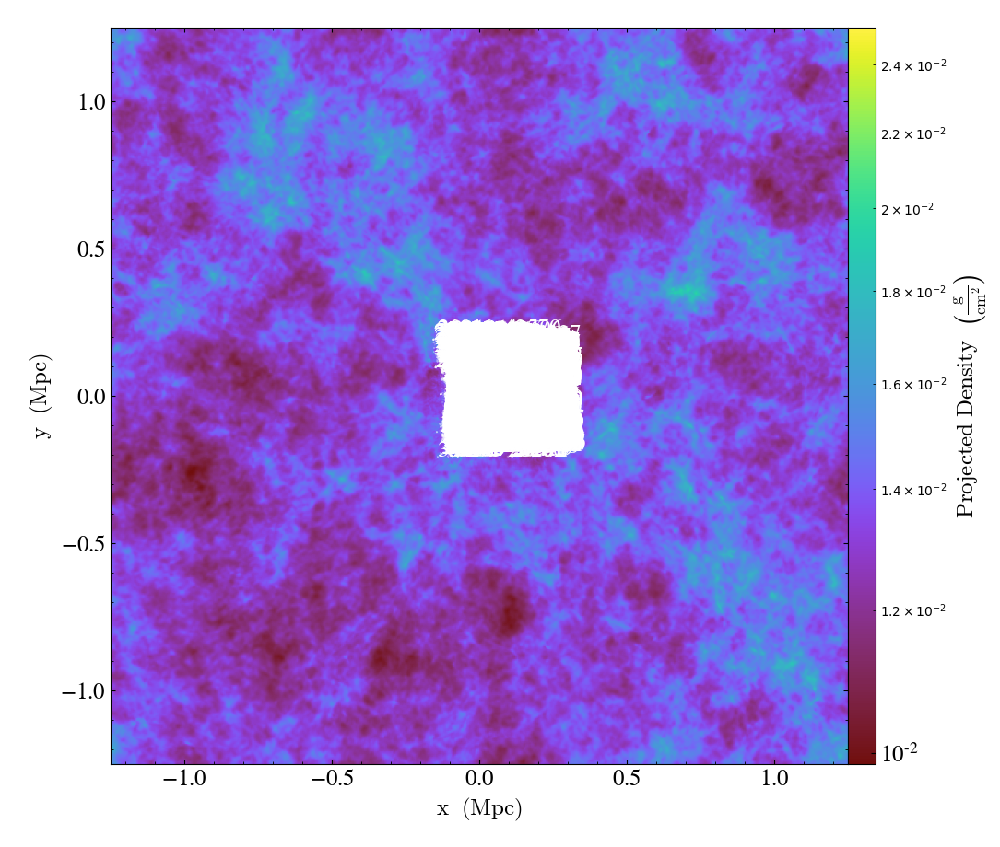

In [10]:
p.show()

yt : [INFO     ] 2023-07-03 13:00:37,884 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



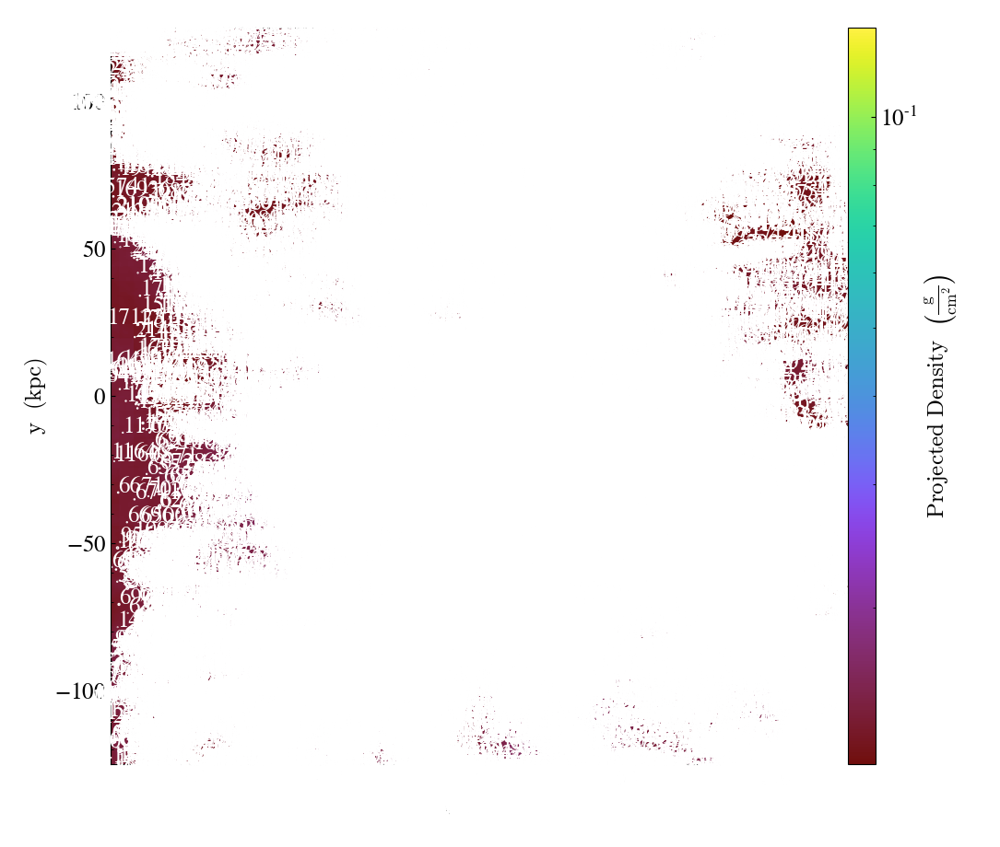

In [11]:
p.zoom(10)


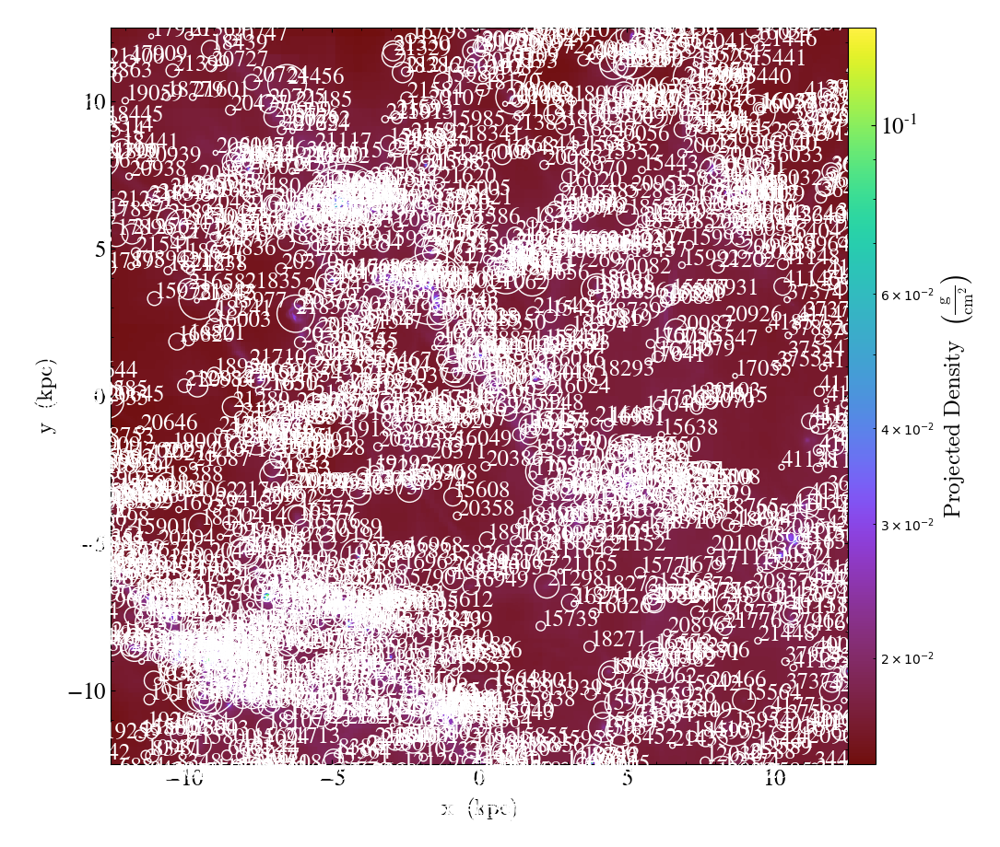

In [12]:
p.zoom(10)

yt : [INFO     ] 2023-07-03 13:06:01,269 Parameters: current_time              = 12.75658720606
yt : [INFO     ] 2023-07-03 13:06:01,270 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-03 13:06:01,271 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-03 13:06:01,271 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-03 13:06:01,272 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-03 13:06:01,272 Parameters: current_redshift          = 14.999999224523
yt : [INFO     ] 2023-07-03 13:06:01,273 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-03 13:06:01,273 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-03 13:06:01,273 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-03 13:06:01,274 Parameters: hubble_constant           = 0.71
yt : [INFO     ] 2023-07-03 13:06:01,430 Parameters: current_time              = 8776711873246487.0 


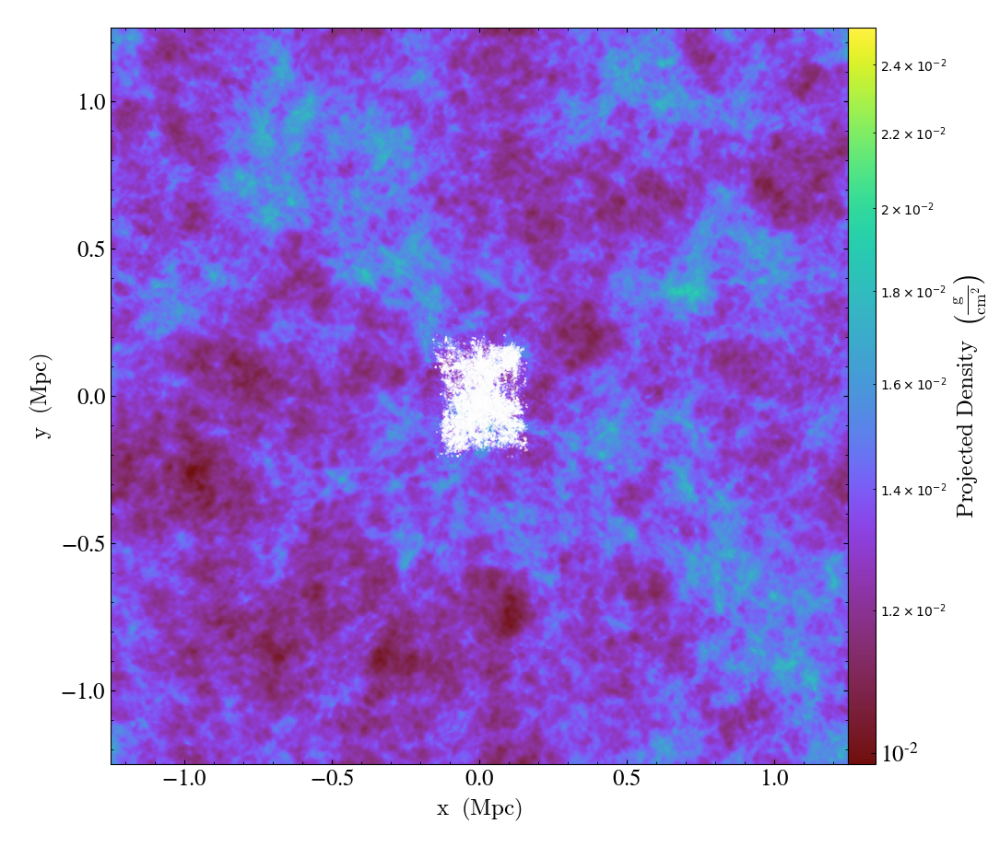

In [13]:
import yt
import yt.extensions.astro_analysis.halo_analysis

data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD0041/RedshiftOutput0041")
halos_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/rockstar_halos/halos_RD0041.0.bin")

p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"))
p.annotate_halos(halos_ds)
p.show()

yt : [INFO     ] 2023-07-03 13:25:48,430 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



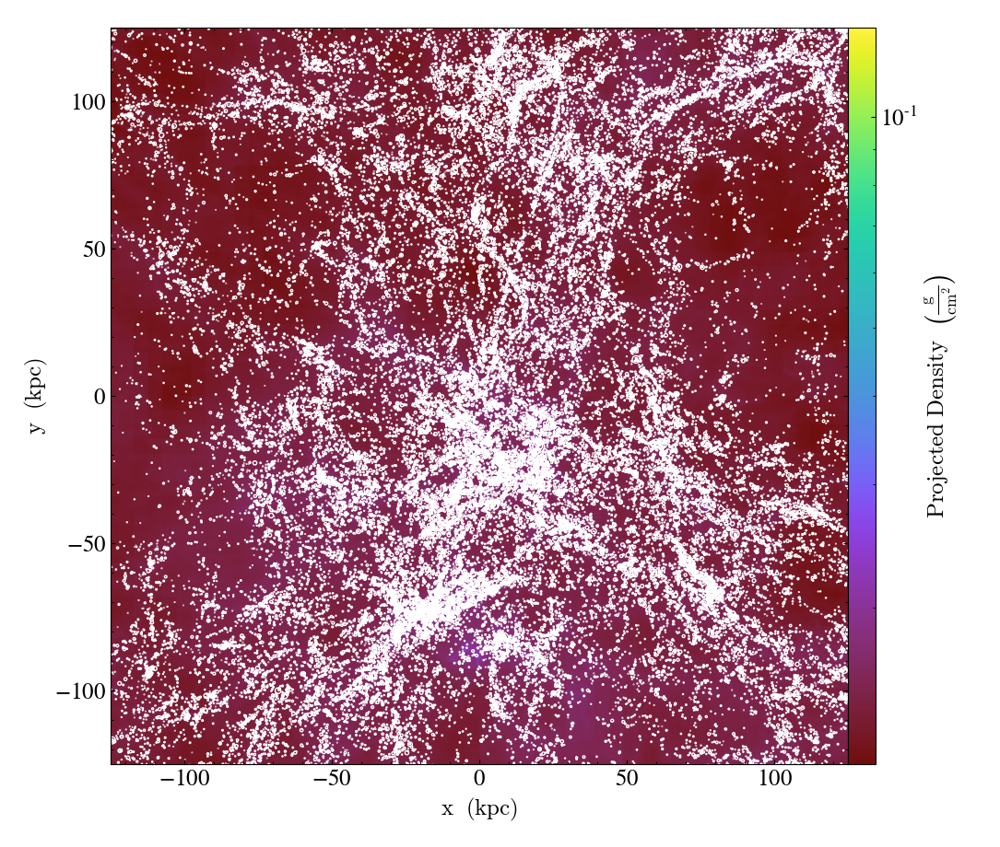

In [14]:
p.zoom(10)
p.annotate_title("")

In [1]:
import yt
import yt.extensions.astro_analysis.halo_analysis

In [5]:
z41centers = []
z41rvir = []
for halo in ds.keys():
    fesc_list = list(ds[halo]['fesc'])
    if fesc_list[0] >= 1e-5:
        z41centers.append(ds[halo]['center'][0])
        z41rvir.append(ds[halo]['rvir'][0])

yt : [INFO     ] 2023-07-20 13:56:43,938 Parameters: current_time              = 12.75658720606
yt : [INFO     ] 2023-07-20 13:56:43,940 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-20 13:56:43,941 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-20 13:56:43,942 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-20 13:56:43,942 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-20 13:56:43,943 Parameters: current_redshift          = 14.999999224523
yt : [INFO     ] 2023-07-20 13:56:43,943 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-20 13:56:43,944 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-20 13:56:43,944 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-20 13:56:43,944 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 342077/342077 [00:30<00:00, 11237.68it/s]
yt : [INFO     ] 2023


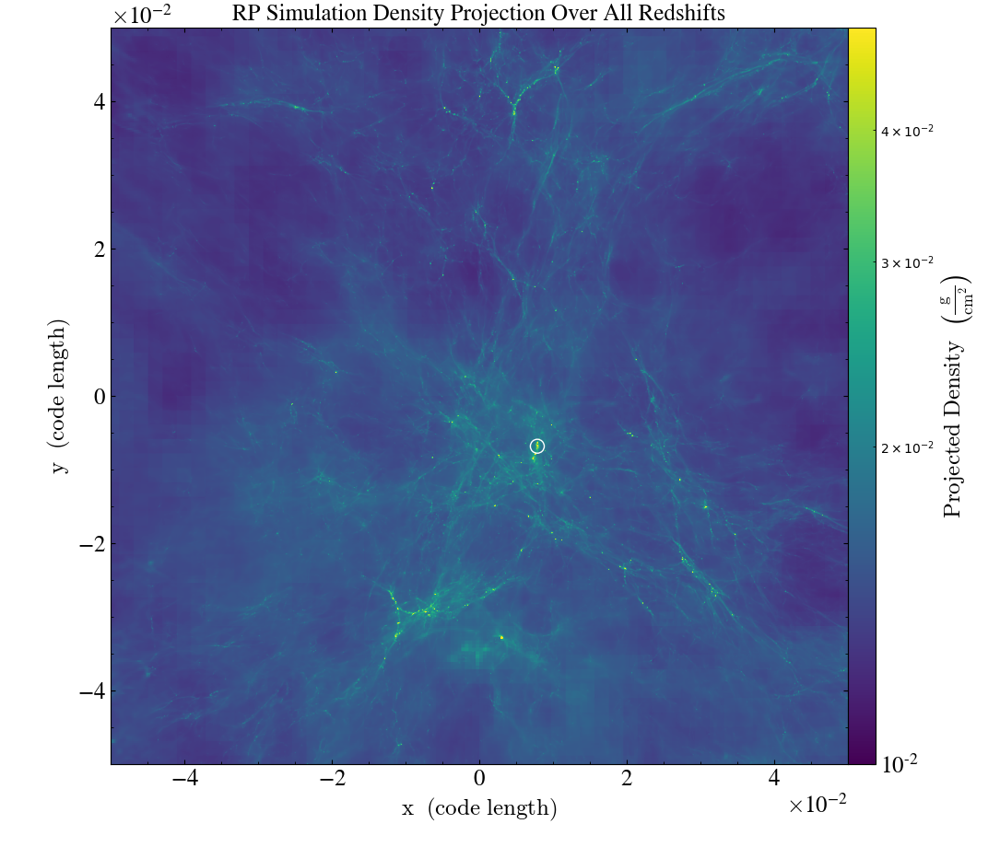

yt : [INFO     ] 2023-07-20 15:53:51,809 Saving plot RP41.png


In [ ]:
ds = h.File('catalog.h5')
data_ds = yt.load('/storage/home/hcoda1/0/jw254/data/RS-RP/RD0041/RedshiftOutput0041')
centers_i = []
rvir_i = []
for idx, halo in enumerate(ds.keys()):
    fesc_list = list(ds[halo]['fesc'])
    if idx < len(fesc_list):
        if fesc_list[idx] >= 1e-5:
            centers_i.append(ds[halo]['center'][idx])
            rvir_i.append(ds[halo]['rvir'][idx]) 
    p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"), width = data_ds.domain_width/10)
    p.annotate_title(f'RP Simulation Density Projection Over All Redshifts')
    for i in range(len(centers_i)):
        p.annotate_sphere(centers_i[i], rvir_i[i])
    p.set_cmap('density', 'viridis')
    p.set_zlim('density', 0.01, 0.05)
    p.show()
    p.save('RP41.png')

yt : [INFO     ] 2023-07-17 21:01:15,450 Parameters: current_time              = 6.5319138967337
yt : [INFO     ] 2023-07-17 21:01:15,451 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-17 21:01:15,451 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-17 21:01:15,452 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-17 21:01:15,453 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-17 21:01:15,453 Parameters: current_redshift          = 23.999998045187
yt : [INFO     ] 2023-07-17 21:01:15,453 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-17 21:01:15,454 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-17 21:01:15,454 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-17 21:01:15,454 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 86332/86332 [00:09<00:00, 8732.50it/s] 
yt : [INFO     ] 2023-


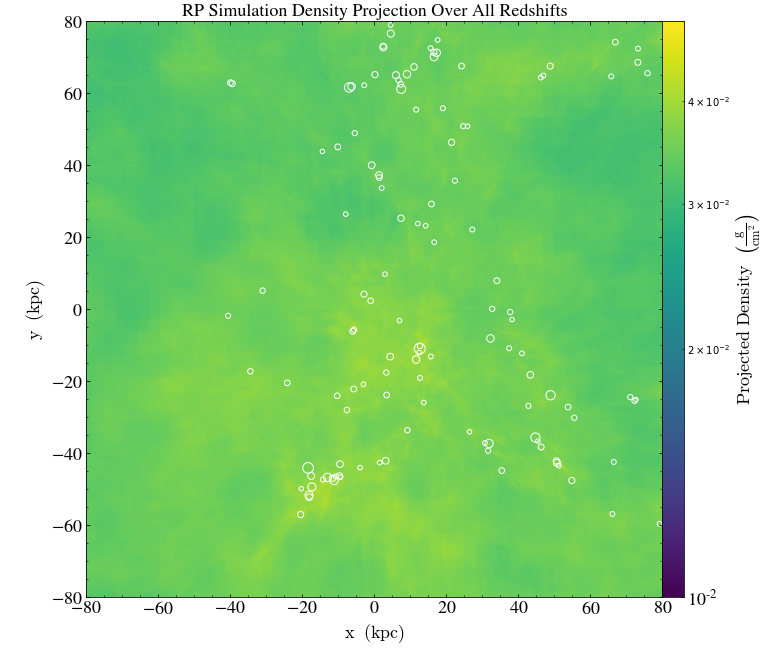

yt : [INFO     ] 2023-07-17 21:54:11,951 Parameters: current_time              = 6.7328745377621
yt : [INFO     ] 2023-07-17 21:54:11,952 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-17 21:54:11,953 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-17 21:54:11,954 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-17 21:54:11,954 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-17 21:54:11,955 Parameters: current_redshift          = 23.499998736628
yt : [INFO     ] 2023-07-17 21:54:11,955 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-17 21:54:11,955 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-17 21:54:11,955 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-17 21:54:11,956 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 91042/91042 [00:09<00:00, 9558.91it/s] 
yt : [INFO     ] 2023-


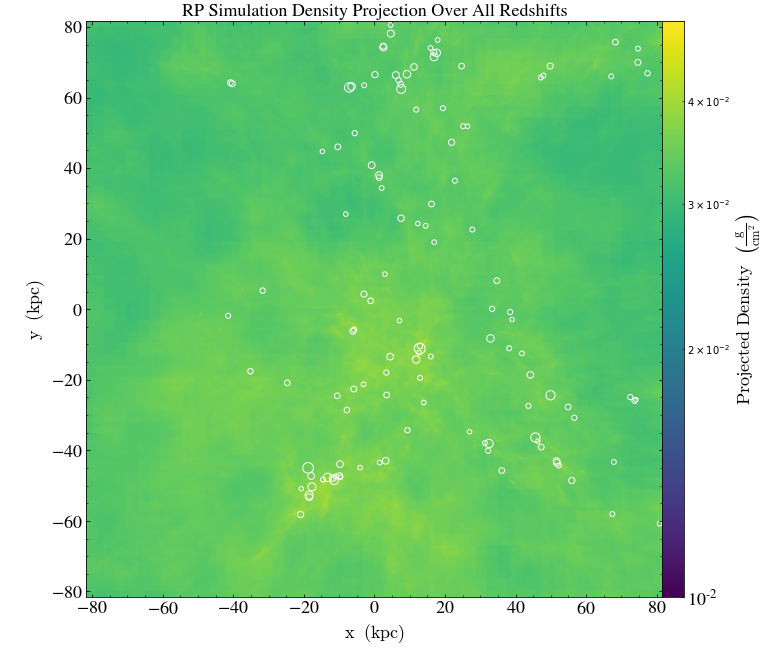

yt : [INFO     ] 2023-07-17 22:45:41,085 Parameters: current_time              = 6.9443560018576
yt : [INFO     ] 2023-07-17 22:45:41,086 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-17 22:45:41,087 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-17 22:45:41,088 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-17 22:45:41,088 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-17 22:45:41,089 Parameters: current_redshift          = 22.999996640863
yt : [INFO     ] 2023-07-17 22:45:41,089 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-17 22:45:41,089 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-17 22:45:41,090 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-17 22:45:41,090 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 95954/95954 [00:09<00:00, 10005.22it/s]
yt : [INFO     ] 2023-


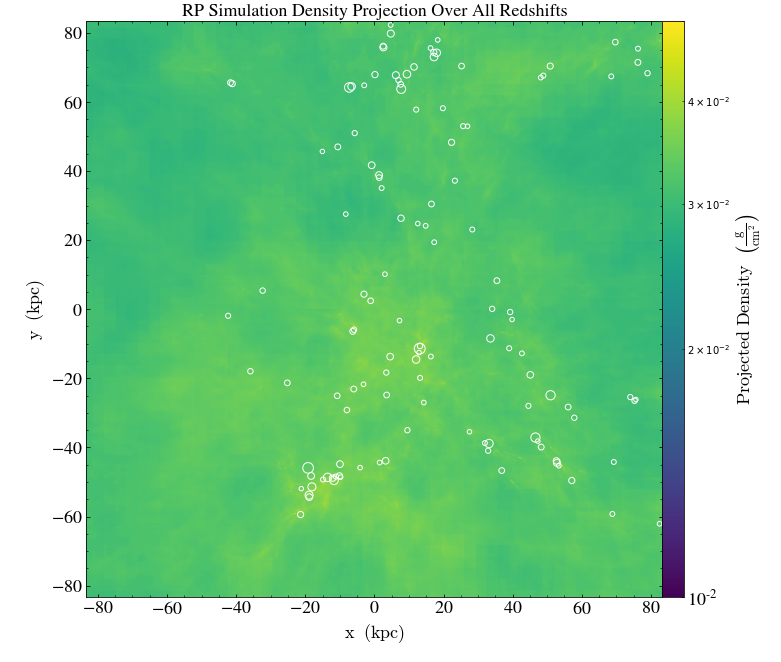

yt : [INFO     ] 2023-07-17 23:43:40,776 Parameters: current_time              = 7.1671440824306
yt : [INFO     ] 2023-07-17 23:43:40,777 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-17 23:43:40,777 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-17 23:43:40,778 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-17 23:43:40,779 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-17 23:43:40,779 Parameters: current_redshift          = 22.499995587659
yt : [INFO     ] 2023-07-17 23:43:40,779 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-17 23:43:40,780 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-17 23:43:40,780 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-17 23:43:40,780 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 102173/102173 [00:11<00:00, 8517.80it/s] 
yt : [INFO     ] 202


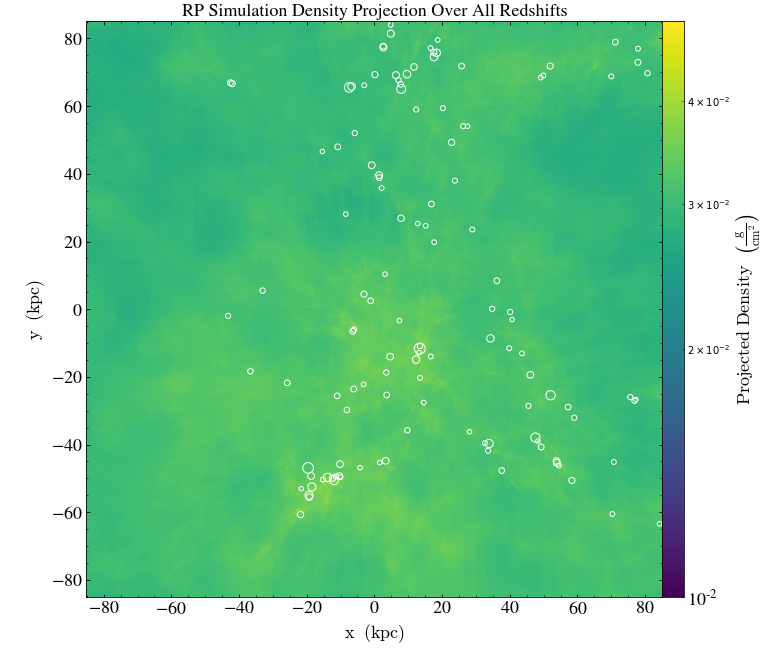

yt : [INFO     ] 2023-07-18 00:48:36,329 Parameters: current_time              = 7.4021036177313
yt : [INFO     ] 2023-07-18 00:48:36,330 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 00:48:36,331 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 00:48:36,332 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 00:48:36,332 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 00:48:36,332 Parameters: current_redshift          = 21.999995289026
yt : [INFO     ] 2023-07-18 00:48:36,333 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 00:48:36,333 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 00:48:36,333 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 00:48:36,333 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 108478/108478 [00:18<00:00, 6015.58it/s] 
yt : [INFO     ] 202


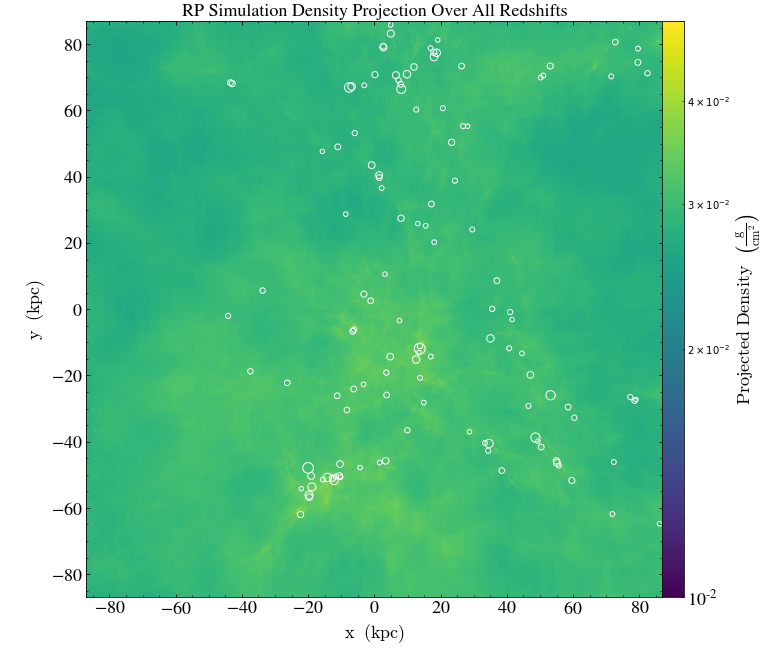

yt : [INFO     ] 2023-07-18 01:49:45,102 Parameters: current_time              = 7.6501857544667
yt : [INFO     ] 2023-07-18 01:49:45,103 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 01:49:45,103 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 01:49:45,104 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 01:49:45,105 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 01:49:45,105 Parameters: current_redshift          = 21.49999670378
yt : [INFO     ] 2023-07-18 01:49:45,105 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 01:49:45,106 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 01:49:45,106 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 01:49:45,106 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 97312/97312 [00:10<00:00, 9682.50it/s] 
yt : [INFO     ] 2023-0


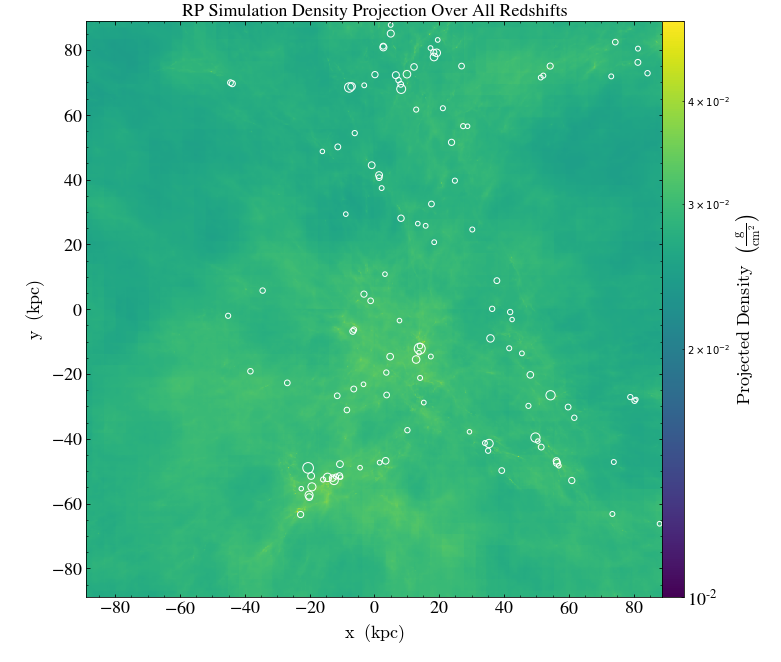

yt : [INFO     ] 2023-07-18 03:09:19,214 Parameters: current_time              = 7.9124408256633
yt : [INFO     ] 2023-07-18 03:09:19,215 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 03:09:19,216 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 03:09:19,217 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 03:09:19,217 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 03:09:19,218 Parameters: current_redshift          = 20.9999980783
yt : [INFO     ] 2023-07-18 03:09:19,218 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 03:09:19,218 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 03:09:19,219 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 03:09:19,219 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 104927/104927 [00:19<00:00, 5497.08it/s] 
yt : [INFO     ] 2023-


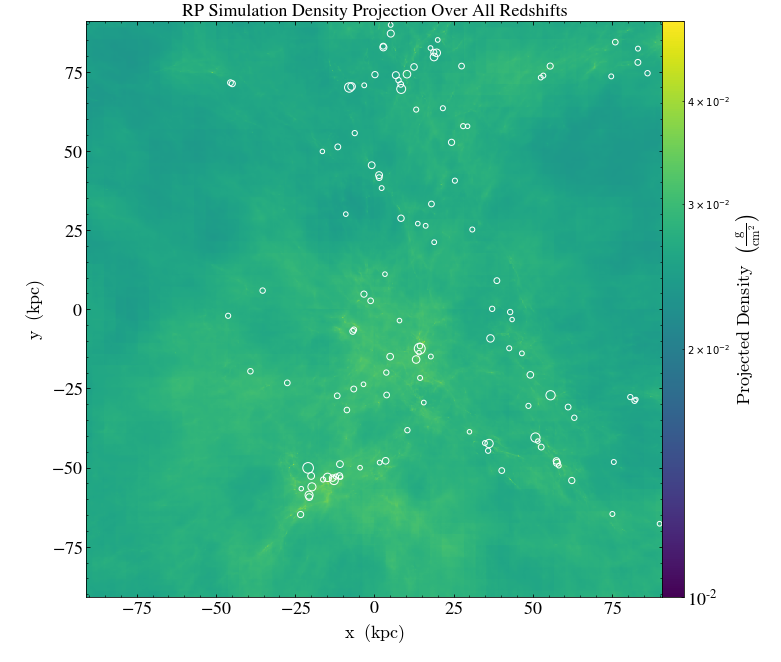

yt : [INFO     ] 2023-07-18 04:52:12,502 Parameters: current_time              = 8.1900289383506
yt : [INFO     ] 2023-07-18 04:52:12,503 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 04:52:12,503 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 04:52:12,504 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 04:52:12,505 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 04:52:12,505 Parameters: current_redshift          = 20.499999148368
yt : [INFO     ] 2023-07-18 04:52:12,505 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 04:52:12,506 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 04:52:12,506 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 04:52:12,506 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 111327/111327 [00:10<00:00, 10197.22it/s]
yt : [INFO     ] 202


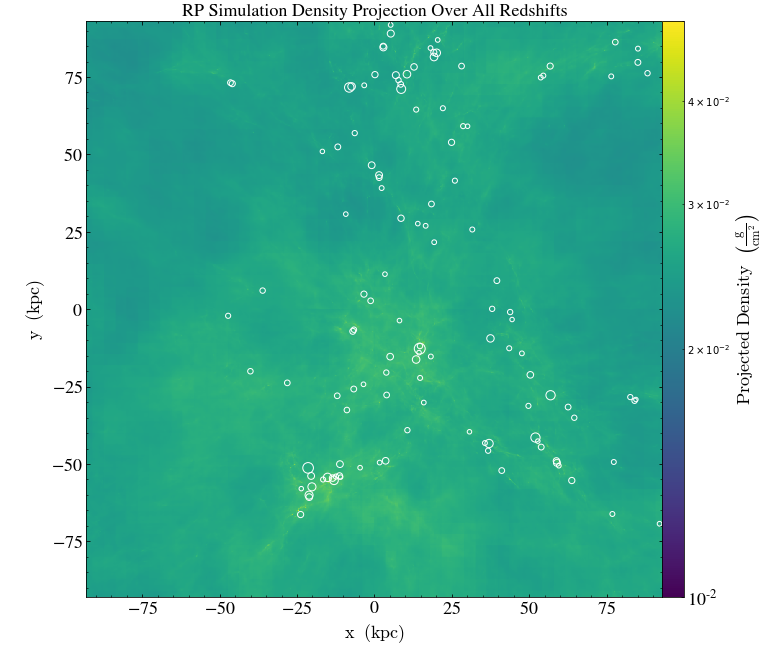

yt : [INFO     ] 2023-07-18 06:37:35,008 Parameters: current_time              = 8.4842355850874
yt : [INFO     ] 2023-07-18 06:37:35,009 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 06:37:35,010 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 06:37:35,010 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 06:37:35,011 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 06:37:35,011 Parameters: current_redshift          = 19.999999012672
yt : [INFO     ] 2023-07-18 06:37:35,011 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 06:37:35,012 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 06:37:35,012 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 06:37:35,012 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 120199/120199 [00:12<00:00, 9388.82it/s] 
yt : [INFO     ] 202


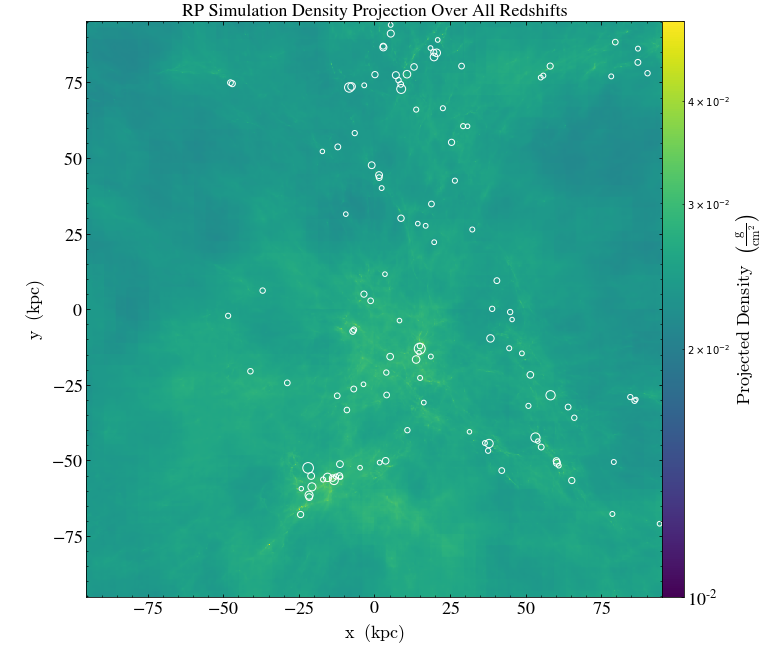

yt : [INFO     ] 2023-07-18 08:22:39,637 Parameters: current_time              = 8.7964878411753
yt : [INFO     ] 2023-07-18 08:22:39,638 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 08:22:39,639 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 08:22:39,640 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 08:22:39,640 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 08:22:39,641 Parameters: current_redshift          = 19.499997352771
yt : [INFO     ] 2023-07-18 08:22:39,641 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 08:22:39,641 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 08:22:39,641 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 08:22:39,642 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 130859/130859 [00:22<00:00, 5853.22it/s] 
yt : [INFO     ] 202


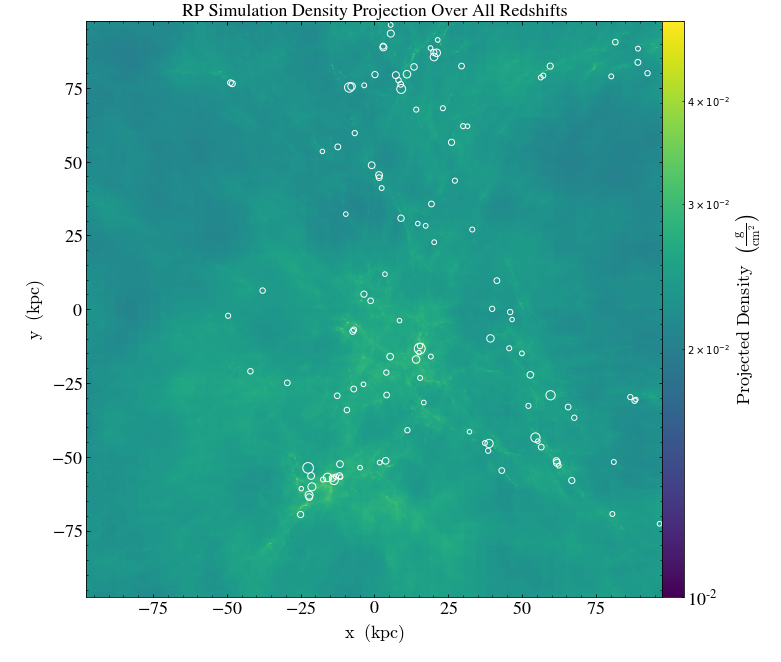

yt : [INFO     ] 2023-07-18 09:37:52,076 Parameters: current_time              = 9.1283713429023
yt : [INFO     ] 2023-07-18 09:37:52,077 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 09:37:52,078 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 09:37:52,079 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 09:37:52,079 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 09:37:52,079 Parameters: current_redshift          = 18.999998145923
yt : [INFO     ] 2023-07-18 09:37:52,080 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 09:37:52,080 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 09:37:52,080 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 09:37:52,081 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 139165/139165 [00:13<00:00, 10309.25it/s]
yt : [INFO     ] 202


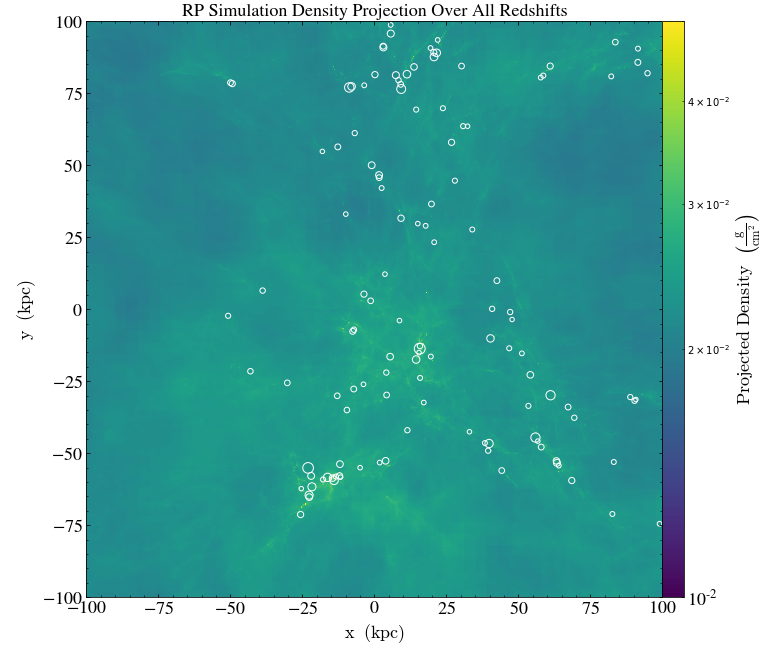

yt : [INFO     ] 2023-07-18 10:55:46,009 Parameters: current_time              = 9.4816606304392
yt : [INFO     ] 2023-07-18 10:55:46,010 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 10:55:46,011 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 10:55:46,012 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 10:55:46,012 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 10:55:46,012 Parameters: current_redshift          = 18.499998156586
yt : [INFO     ] 2023-07-18 10:55:46,013 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 10:55:46,013 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 10:55:46,013 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 10:55:46,014 Parameters: hubble_constant           = 0.71
Parsing Hierarchy :   9%|▉         | 15656/176609 [00:01<00:10, 15001.12it/s]Exception ignored in: 

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [31]:
import matplotlib.pyplot as plt
for i in range(2,42):
    if i < 10:
        data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD000" + str(i) + "/RedshiftOutput000" + str(i))
    else:
        data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD00" + str(i) + "/RedshiftOutput00" + str(i))
    p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"))
    p.annotate_title(f'RP Simulation Density Projection Over All Redshifts')
    for j in range(len(z41centers)):
        p.annotate_sphere(z41centers[j], z41rvir[j])
    p.zoom(10)
    p.set_cmap('density', 'viridis')
    p.set_zlim('density', 0.01, 0.05)
    p.show()
    plt.savefig(f'TrialRP{i}.png')

In [23]:
simulation_directory = '/storage/home/hcoda1/0/jw254/data/RS-RP/'
ts = yt.load(simulation_directory + 'RD????'+ '/RedshiftOutput????')

/storage/home/hcoda1/0/jw254/data/RS-RP/RD????/RedshiftOutput????


yt : [INFO     ] 2023-07-18 10:56:22,824 Parameters: current_time              = 9.4816606304392
yt : [INFO     ] 2023-07-18 10:56:22,825 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 10:56:22,825 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 10:56:22,826 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 10:56:22,827 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 10:56:22,827 Parameters: current_redshift          = 18.499998156586
yt : [INFO     ] 2023-07-18 10:56:22,827 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 10:56:22,828 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 10:56:22,828 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 10:56:22,828 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 176609/176609 [00:21<00:00, 8180.18it/s] 
yt : [INFO     ] 202


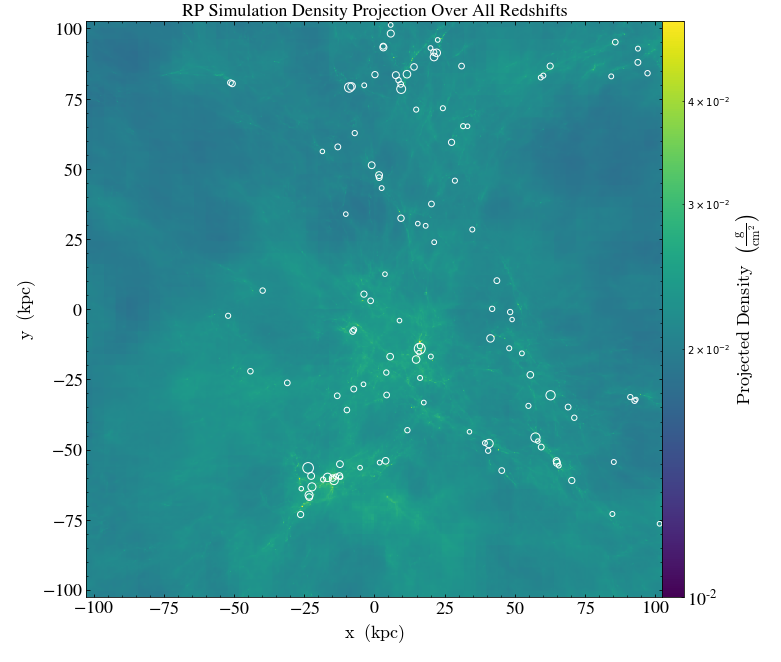

yt : [INFO     ] 2023-07-18 11:58:20,353 Saving plot TrialRP13.png
yt : [INFO     ] 2023-07-18 11:58:21,538 Parameters: current_time              = 9.8583380272615
yt : [INFO     ] 2023-07-18 11:58:21,539 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-18 11:58:21,540 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-18 11:58:21,541 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-18 11:58:21,541 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-18 11:58:21,542 Parameters: current_redshift          = 17.999999217248
yt : [INFO     ] 2023-07-18 11:58:21,542 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-18 11:58:21,542 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-18 11:58:21,543 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-18 11:58:21,543 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|███████

KeyboardInterrupt: 

In [32]:
for i in range(13,42):
    if i < 10:
        data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD000" + str(i) + "/RedshiftOutput000" + str(i))
    else:
        data_ds = yt.load("/storage/home/hcoda1/0/jw254/data/RS-RP/RD00" + str(i) + "/RedshiftOutput00" + str(i))
    p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"))
    p.annotate_title(f'RP Simulation Density Projection Over All Redshifts')
    for j in range(len(z41centers)):
        p.annotate_sphere(z41centers[j], z41rvir[j])
    p.zoom(10)
    p.set_cmap('density', 'viridis')
    p.set_zlim('density', 0.01, 0.05)
    p.show()
    p.save(f'TrialRP{i}.png')

In [1]:
import yt
import h5py as h

In [4]:
ds = h.File('catalog.h5')
data_ds = yt.load('/storage/home/hcoda1/0/jw254/data/RS-RP/RD0002/RedshiftOutput0002')
centers_i = []
rvir_i = []
for idx, halo in enumerate(ds.keys()):
    fesc_list = list(ds[halo]['fesc'])
    if idx < len(fesc_list):
        if fesc_list[idx] >= 1e-5:
            centers_i.append(ds[halo]['center'][idx])
            rvir_i.append(ds[halo]['rvir'][idx]) 
    p = yt.ProjectionPlot(data_ds, "z", ("gas", "density"), width = data_ds.domain_width/10)
    p.annotate_title(f'RP Simulation Density Projection Over All Redshifts')
    for i in range(len(centers_i)):
        p.annotate_sphere(centers_i[i], rvir_i[i])
    p.set_cmap('density', 'viridis')
    p.set_zlim('density', 0.01, 0.05)
    p.save('RP02.png')

yt : [INFO     ] 2023-07-20 11:58:12,487 Parameters: current_time              = 6.5319138967337
yt : [INFO     ] 2023-07-20 11:58:12,488 Parameters: domain_dimensions         = [512 512 512]
yt : [INFO     ] 2023-07-20 11:58:12,489 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-07-20 11:58:12,490 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2023-07-20 11:58:12,491 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-07-20 11:58:12,491 Parameters: current_redshift          = 23.999998045187
yt : [INFO     ] 2023-07-20 11:58:12,491 Parameters: omega_lambda              = 0.734
yt : [INFO     ] 2023-07-20 11:58:12,492 Parameters: omega_matter              = 0.266
yt : [INFO     ] 2023-07-20 11:58:12,492 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-07-20 11:58:12,492 Parameters: hubble_constant           = 0.71
Parsing Hierarchy : 100%|██████████| 86332/86332 [00:08<00:00, 10452.26it/s]
yt : [INFO     ] 2023-

KeyboardInterrupt: 